In [1]:
# Parses through the taxonomy of the SRA search contigs.

#Warning, the  taxpath pickle for the sra search is rather heavy to read.

# Some input files are not included, and can be found on zenodo or can be downloaded via NCBI (ncbi taxdump).
# Keep in mind the names.dmp / nodes.dmp are reduced (omit '|').

#List of these files:

#../data/contigs.skesa.size500.clus9780.taxpath.pkl (zenodo)
#../data/namesRED.dmp (taxdump)
#../data/nodesRED.dmp (taxdump)
#../data/viralcontigs_skesa_round2.tblx (zenodo)
#../data/nucl_gb.accession2taxid (NCBI taxonomy)

In [ ]:
import pandas as pd
import pickle
import seaborn as sns
import matplotlib.pyplot as plt
from graph_tool.all import *
import numpy as np
import dask.dataframe as dd
from dask.diagnostics import ProgressBar
from matplotlib import rcParams
rcParams.update({'figure.autolayout': True})
sns.set(font='arial')
sns.set_style("white")
sns.set_style("ticks")
%matplotlib inline

In [2]:
with open('../data/contigs.skesa.size500.clus9780.taxpath.pkl', 'rb') as f:
    taxlist = pickle.load(f)
virlist = []
for i in taxlist:
    if 10239 in i:
        virlist.append(i)
len(virlist)

8308

In [3]:
#Before naming them, get the 'rank' of each of the tax ids.
nodes = pd.read_csv("../data/nodesRED.dmp",delimiter='\t',encoding='utf-8')
virdic = {}
for i in virlist:
    taxdic = {}
    for j in i:
        if 'Contig' in str(j):
            name = str(j).replace('scaffolds_','')
        else:
            tax = int(j)
            rank = nodes[nodes['tax'] == tax].iat[0,2]
            taxdic[rank] = tax
    virdic[name] = taxdic

In [5]:
#Change taxID numbers into names
names = pd.read_csv("../data/namesRED.dmp",delimiter='\t',encoding='utf-8')
namedic = {}
for i in virdic:
    name = str(i)
    tempdic = {}
    for j in virdic[i]:
        nam = names[names['tax'] == int(virdic[i][j])].iat[0,1]
        tempdic[j] = nam
    namedic[i] = tempdic

In [7]:
#Wrap in dataframe
namedf = pd.DataFrame(namedic)
namedf = namedf.T
namedf = namedf.fillna('Unclassified')
namedf['family'].unique()

#Save the output, it's used later.
#namedf.to_csv("../data/notebooks_out/viral_df_taxonomy_SRA.csv")

In [32]:
#namedf = pd.read_csv('output/viral_df_taxonomy_SRA.csv', index_col=0)

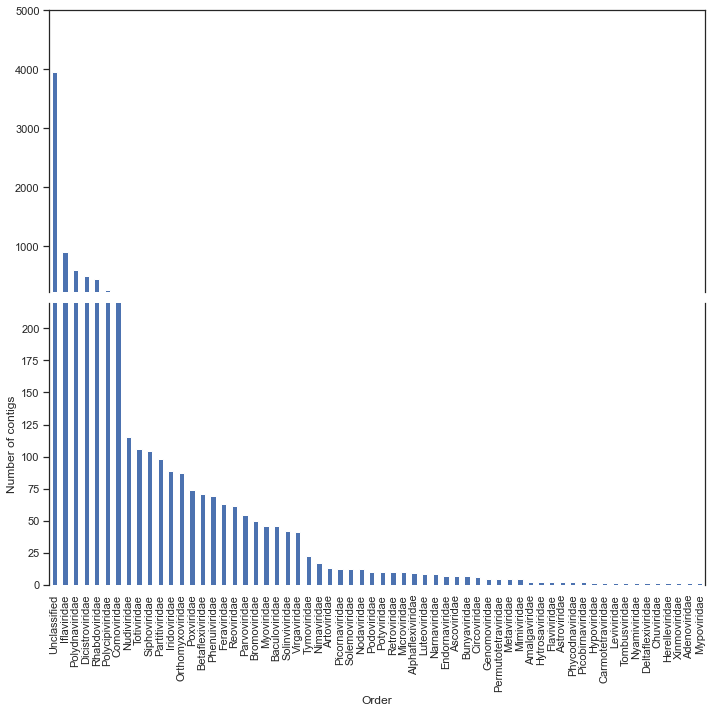

In [9]:
#Time for some plots.

#Order counts:
XX = namedf['family'].value_counts()
g = fig, (ax1,ax2) = plt.subplots(2,1,sharex=True,
                         figsize=(5,5))

g = ax1.spines['bottom'].set_visible(False)
g = ax2.spines['bottom'].set_visible(False)
g = ax2.spines['top'].set_visible(False)
g = ax1.tick_params(axis='x',which='both',bottom=False)
g = ax2.tick_params(axis='x',which='both',bottom=False)


g = ax2.set_ylim(0,220)
g = ax1.set_ylim(220,5000)

g = ax2.set_ylabel("Number of contigs")
g = ax2.set_xlabel("Order")
g = XX.plot(ax=ax1,kind='bar',figsize=(10,10))
g = XX.plot(ax=ax2,kind='bar',figsize=(10,10))
g
#g.figure.savefig('figures/familycount_SRAdenovo.png', dpi=300)

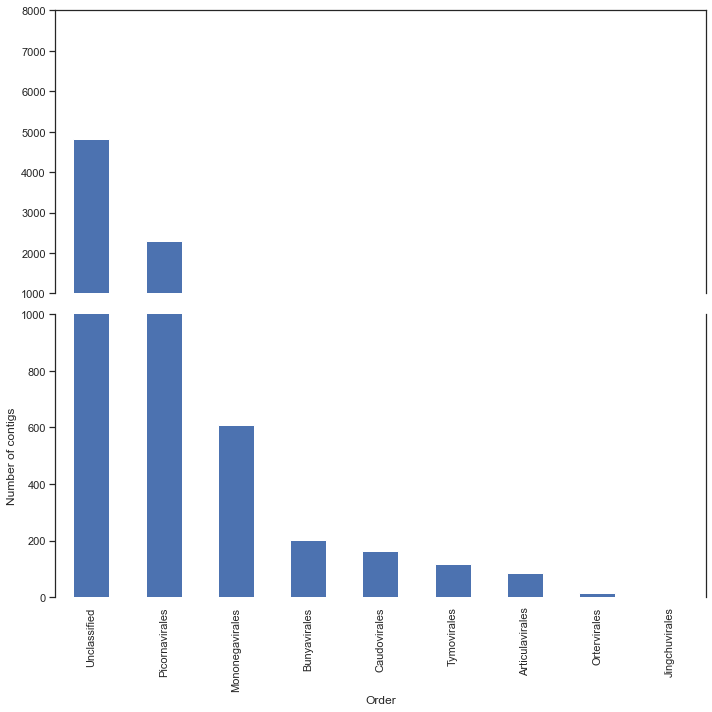

<Figure size 720x720 with 0 Axes>

In [10]:
#Time for some plots.

#Order counts:
XX = namedf['order'].value_counts()
g = fig, (ax1,ax2) = plt.subplots(2,1,sharex=True,
                         figsize=(5,5))

g = ax1.spines['bottom'].set_visible(False)
g = ax2.spines['bottom'].set_visible(False)
g = ax2.spines['top'].set_visible(False)
g = ax1.tick_params(axis='x',which='both',bottom=False)
g = ax2.tick_params(axis='x',which='both',bottom=False)


g = ax2.set_ylim(0,1000)
g = ax1.set_ylim(1000,8000)

g = ax2.set_ylabel("Number of contigs")
g = ax2.set_xlabel("Order")
g = XX.plot(ax=ax1,kind='bar',figsize=(10,10))
g = XX.plot(ax=ax2,kind='bar',figsize=(10,10))

plt.figure(figsize=(10,10))
plt.tight_layout()
g
#g.figure.savefig('figures/ordercount_SRAdenovo.png', dpi=300)

In [11]:
namedf[namedf['order'] == 'Unclassified'].head()

,no rank,superkingdom,phylum,subphylum,class,order,species,family,genus,subfamily
DRR028884.Contig_11458_13.855_length_2626,unclassified RNA viruses ShiM-2016,Vira,Unclassified,Unclassified,Unclassified,Unclassified,Wuhan arthropod virus 2,Unclassified,Unclassified,Unclassified
DRR028884.Contig_3125_75.5775_length_1653,all,Vira,Unclassified,Unclassified,Unclassified,Unclassified,Lymantria xylina MNPV,Baculoviridae,Alphabaculovirus,Unclassified
DRR028884.Contig_5713_5.96173_length_804,unclassified RNA viruses ShiM-2016,Vira,Unclassified,Unclassified,Unclassified,Unclassified,Wuhan arthropod virus 2,Unclassified,Unclassified,Unclassified
DRR028889.Contig_12350_146.144_length_1081,all,Vira,Unclassified,Unclassified,Unclassified,Unclassified,Lymantria xylina MNPV,Baculoviridae,Alphabaculovirus,Unclassified
DRR028889.Contig_24090_10029.5_length_6647,unclassified RNA viruses ShiM-2016,Vira,Unclassified,Unclassified,Unclassified,Unclassified,Wuhan arthropod virus 2,Unclassified,Unclassified,Unclassified


In [12]:
#Put them in a graph:
## Plot viruses in a graph with refseqs.
tblx = []
#Read in tblx output.
with open('../data/viralcontigs_skesa_round2.tblx') as f:
    for line in f:
        if line.strip().split()[0] != line.strip().split()[1] and float(line.strip().split()[10]) < 1e-15:
            tblx.append(line.strip().split())
interactdir = {}
for i in tblx:
    couplestr = str(i[0]) + '|' + str(i[1])
    revcouplestr = str(i[1]) + '|' + str(i[0])
    bit = float(i[11])
    if couplestr in interactdir:
        if interactdir[couplestr] < bit:
            interactdir[couplestr] = bit
    if revcouplestr in interactdir:
        if interactdir[revcouplestr] < bit:
            interactdir[revcouplestr] = bit
    else:
        interactdir[couplestr] = bit
tblx_network = []
for i in interactdir:
    str1 = i.split('|')[0]
    str2 = i.split('|')[1]
    bit = interactdir[i]
    tblx_network.append([str1,str2,bit])

In [13]:
g = Graph(directed=False)
allvert = {}
v_prop = g.new_vertex_property("string")
e_prop = g.new_edge_property("float")
counter = 0
for i in tblx_network:
    if i[0] not in allvert:
        allvert[i[0]] = counter
        counter += 1
        e = g.add_vertex()
        if 'Contig' in i[0]:
            v_prop[e] = 'red'
        else:
            v_prop[e] = 'grey'
    if i[1] not in allvert:
        allvert[i[1]] = counter
        counter += 1
        e = g.add_vertex()
        if 'Contig' in i[1]:
            v_prop[e] = 'red'
        else:
            v_prop[e] = 'grey'
    e = g.add_edge(allvert[i[0]], allvert[i[1]])
    e_prop[e] = i[2]

In [37]:
#Write the graph for viz in cytoscape / gephi.
#Wrap network in df.
#tblxdf = pd.DataFrame(tblx_network)
#tblxdf.to_csv('../data/notebooks_out/skesa_tblx_network.csv',index=False,header=False)

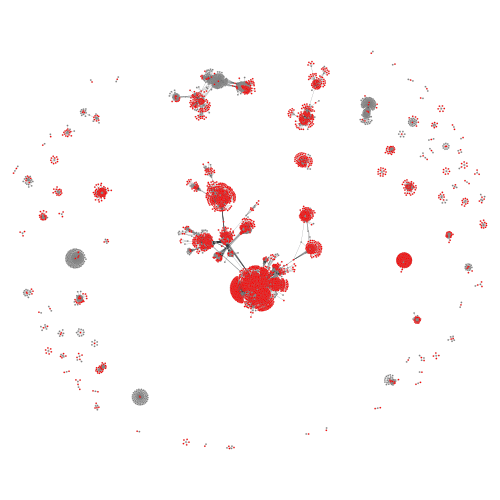

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x7f9b62c7d198, at 0x7f9b62395898>

In [16]:
graph_draw(g, vertex_fill_color=v_prop ,output_size=(500, 500))

In [17]:
## Grab the taxonomy of the reference sequences.
reflist = []
for i in tblx_network:
    if 'Contig' not in i[0] and i[0].split('.')[0] not in reflist:
        reflist.append(i[0].split('.')[0])
    if 'Contig' not in i[1] and i[1].split('.')[0] not in reflist:
        reflist.append(i[1].split('.')[0])

In [18]:
#Grab the tax ID.
ProgressBar().register()
dask_df = dd.read_csv('../data/nucl_gb.accession2taxid', header=0, sep='\t')
dask_df.npartitions
taxdask = dask_df[dask_df['accession'].isin(reflist)]
taxlist = taxdask.compute()

[########################################] | 100% Completed |  4min 48.0s


In [19]:
reftaxlist = []
for i in list(taxlist['accession']):
    taxid = list(taxlist[taxlist['accession'] == i]['taxid'])[0]
    reftaxlist.append([i,taxid])

#Pickle the list (run tax.py on this pickle outside of jupyter).
#with open('../data/notebooks_out/SRA_refstaxlist.pkl', 'wb') as f:
#    pickle.dump(reftaxlist, f)

In [23]:
#Run the tax.py script on the pickled list to get taxpaths.
with open('../data/notebooks_out/SRA_refs_taxpathlist.pkl', 'rb') as f:
    reftaxpath = pickle.load(f)
#Before naming them, get the 'rank' of each of the tax ids.
nodes = pd.read_csv("../data/nodesRED.dmp",delimiter='\t',encoding='utf-8')
refdic = {}
for i in reftaxpath:
    taxdic = {}
    for j in i:
        if 'NC' in str(j):
            name = str(j)
        else:
            tax = int(j)
            rank = nodes[nodes['tax'] == tax].iat[0,2]
            taxdic[rank] = tax
    refdic[name] = taxdic

In [24]:
#Change taxID numbers into names
names = pd.read_csv("../data/namesRED.dmp",delimiter='\t',encoding='utf-8')
namedic = {}
for i in refdic:
    name = str(i)
    tempdic = {}
    for j in refdic[i]:
        nam = names[names['tax'] == int(refdic[i][j])].iat[0,1]
        tempdic[j] = nam
    namedic[i] = tempdic

In [25]:
refnamedf = pd.DataFrame(namedic)
refnamedf = refnamedf.T
famref = {}
for i in refnamedf.index:
    if refnamedf.loc[i,]['order'] in famref:
        famref[refnamedf.loc[i,]['order']].append(i)
    else:
        famref[refnamedf.loc[i,]['order']] = [i]
famref.keys()

dict_keys(['Mononegavirales', 'Ortervirales', nan, 'Tymovirales', 'Picornavirales', 'Articulavirales', 'Bunyavirales', 'Jingchuvirales', 'Muvirales', 'Herpesvirales'])

In [26]:
#Create coldic:
refcol = {}
counter = 0
for i in famref:
    if i == 'Picornavirales':
        for j in famref[i]:
            refcol[j] = '#1f77b4'
    if i == 'Mononegavirales':
        for j in famref[i]:
            refcol[j] = '#2ca02c'
    if i == 'nan':
        for j in famref[i]:
            refcol[j] = '#7f7f7f'
    if i == 'Tymovirales':
        for j in famref[i]:
            refcol[j] = '#ff7f0e'
    if i == 'Ortervirales':
        for j in famref[i]:
            refcol[j] = '#7f7f7f'
    if i == 'Articulavirales':
        for j in famref[i]:
            refcol[j] = '#9467bd'
    if i == 'Bunyavirales':
        for j in famref[i]:
            refcol[j] = '#e377c2'
    if i == 'Jingchuvirales':
        for j in famref[i]:
            refcol[j] = '#bcbd22'
    if i == 'Herpesvirales':
        for j in famref[i]:
            refcol[j] = '#7f7f7f'
    if i == 'Muvirales':
        for j in famref[i]:
            refcol[j] = 'black'
for i in famref:
    print(str(i) + ' ' + str(len(famref[i])))

Mononegavirales 201
Ortervirales 155
nan 2303
Tymovirales 231
Picornavirales 364
Articulavirales 32
Bunyavirales 119
Jingchuvirales 8
Muvirales 8
Herpesvirales 1


In [27]:
#Recreate network in colors:
g = Graph(directed=False)
allvert = {}
v_prop = g.new_vertex_property("string")
e_prop = g.new_edge_property("float")
counter = 0
for i in tblx_network:
    if i[0] not in allvert:
        allvert[i[0]] = counter
        counter += 1
        e = g.add_vertex()
        if 'Contig' in i[0]:
            v_prop[e] = '#d62728'
        else:
            if i[0].split('.')[0] in refcol:
                v_prop[e] = refcol[i[0].split('.')[0]]
            else:
                v_prop[e] = '#7f7f7f'
    if i[1] not in allvert:
        allvert[i[1]] = counter
        counter += 1
        e = g.add_vertex()
        if 'Contig' in i[1]:
            v_prop[e] = '#d62728'
        else:
            if i[1].split('.')[0] in refcol:
                v_prop[e] = refcol[i[1].split('.')[0]]
            else:
                v_prop[e] = '#7f7f7f'
    e = g.add_edge(allvert[i[0]], allvert[i[1]])
    e_prop[e] = i[2]

In [47]:
#For saving push this up to 10000x10000
graph_draw(g, vertex_fill_color=v_prop ,output_size=(500, 500))

<PropertyMap object with key type 'Vertex' and value type 'vector<double>', for Graph 0x7f7e286316a0, at 0x7f7e272066a0>

In [28]:
state_dc = minimize_nested_blockmodel_dl(g, deg_corr=False)

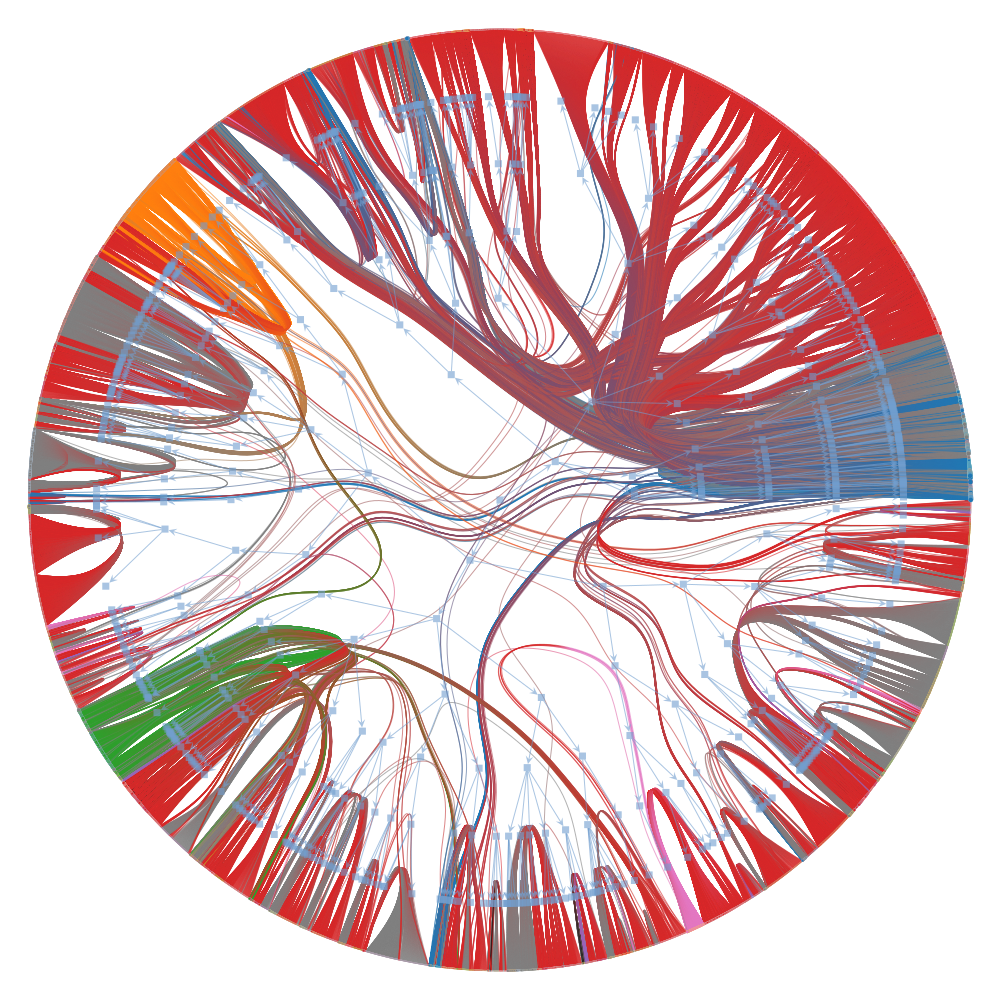

(<VertexPropertyMap object with value type 'vector<double>', for Graph 0x7fa0047da8d0, at 0x7fa003193ef0>,
 <Graph object, directed, with 8625 vertices and 8624 edges at 0x7fa004f54550>,
 <VertexPropertyMap object with value type 'vector<double>', for Graph 0x7fa004f54550, at 0x7f9b743ce6a0>)

In [29]:
draw_hierarchy(state_dc,vertex_fill_color=v_prop,output_size=(1000, 1000))

In [30]:
#draw_hierarchy(state_dc,vertex_fill_color=v_prop,output_size=(10000, 10000), output='figures/Bee_tblx_graph_SRA_minizenestedblock.png')

In [31]:
#Save with names
#draw_hierarchy(state_dc,vertex_fill_color=v_prop,vertex_font_size=50,output_size=(10000, 10000), output='figures/Bee_tblx_graph_SRA_minizenestedblock_NAMES.png')